<h2>Kaan Arı<br>
21628042</h2>
<center>
<img align ="center" src="assets/hacettepe.png" alt="Hacettepe University Logo" width="200\">
<h1>Hacettepe University</h1>
<h1>ELE492 : Image Processing - Homework 1</h1>

___

### Q1)
<br>

```
I have not received or given any aid in this homework. All the work presented  below is my own work.
                                                  - Kaan Arı                                                     
```

<img align ="right" src="assets/signature.png" alt="Hacettepe University Logo" width="250">

___

### Q2)

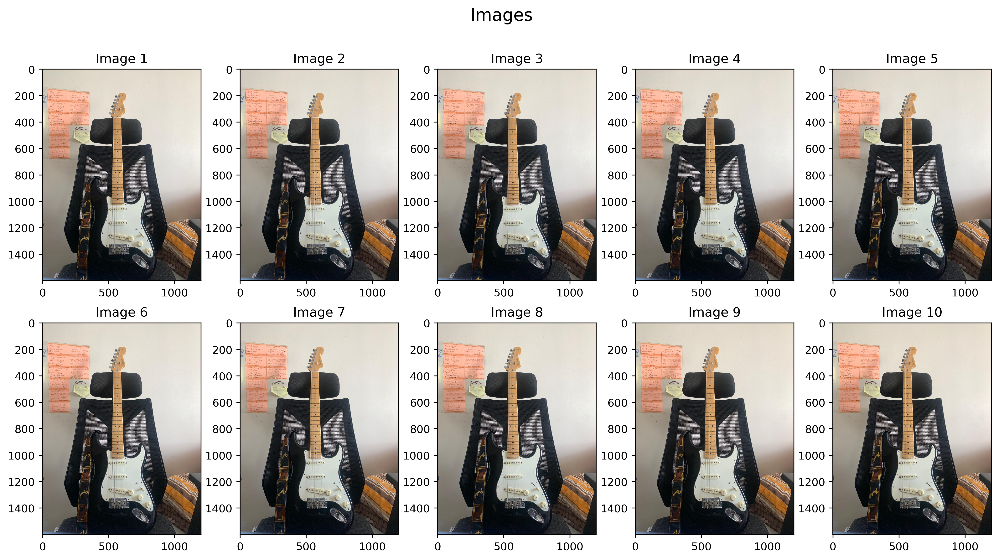

In [10]:
import os
import cv2
from matplotlib import pyplot as plt

# Create array of image names
images = [str(i)+".jpeg" for i in range(1,11)] 


images = [cv2.cvtColor(cv2.imread("./assets/hw1/"+img), cv2.COLOR_BGR2RGB) for img in images]
# Import Images as RGB

num_rows = 2
num_columns = 5

f, ax_arr = plt.subplots(num_rows, num_columns, figsize=(16,8))

for j, row in enumerate(ax_arr):
    for i, ax in enumerate(row):
        ax.imshow(images[j*num_columns+i])
        ax.set_title(f'Image {j*num_columns+i+1}')

title = 'Images'
f.suptitle(title, fontsize=16)
plt.rcParams['figure.dpi'] = 400 
plt.show()

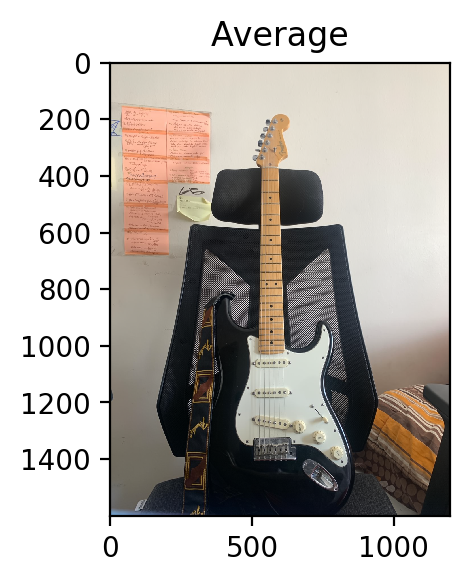

In [2]:
import numpy as np

# Changing data type to prevent overflow
images = [img.astype(np.uint32) for img in images]

# Creating zeros
average = np.zeros(images[0].shape,np.uint32)

# Calculating average
for i in range(10):
    average += images[i]

average = average/len(images)
# Discarding floating part(converting to integer) to integer value
average = average.astype(np.uint8)

# Plotting
plt.rcParams['figure.figsize'] = [7, 3]
plt.rcParams['figure.dpi'] = 200 
plt.imshow(average)
plt.title("Average")
plt.show()

Thanks to todays high quality phone cameras, I think we can not see significant difference between average and samples because they have built-in noise reduction functionalities. Most important part of this question is existence of overflow. Due to overflow, I should first convert image data type to unsigned integer 32-bit, then calculate average. After that, I should convert it to unsigned integer 8-bit.

___

### Q3)

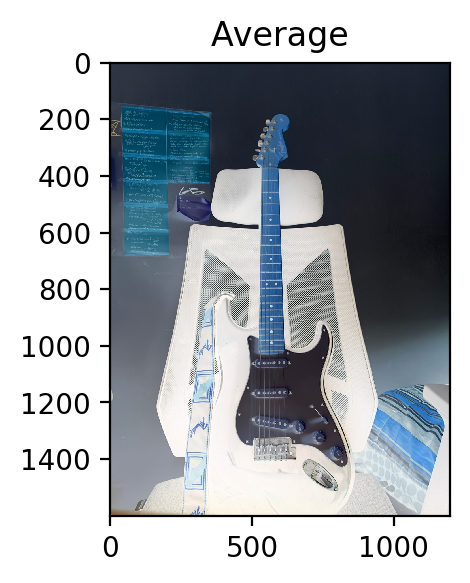

In [3]:
def image_negative(image):
    return 255-image

average_neg = image_negative(average)

plt.imshow(average_neg)
plt.title("Average")
plt.show()

___

### Q4)

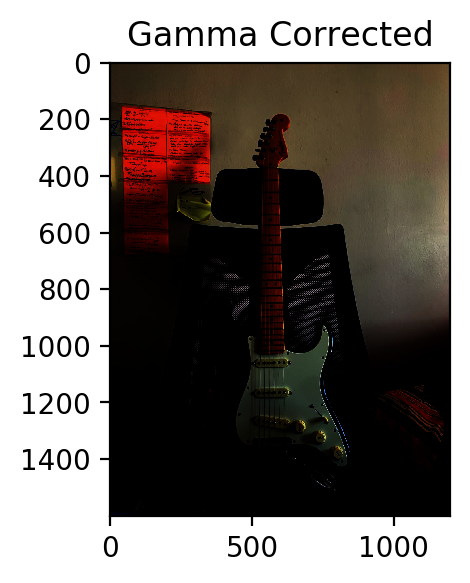

In [4]:
def gamma_correction(image, gamma = 1, c = 1):
    image = image.astype(np.float64)/255
    image = c*(image**gamma)
    image = image*255
    return image.astype(np.uint8)

average_gamma_corrected = gamma_correction(average,9,0.9)

plt.imshow(average_gamma_corrected)
plt.title("Gamma Corrected")
plt.show()

___

### Q5)

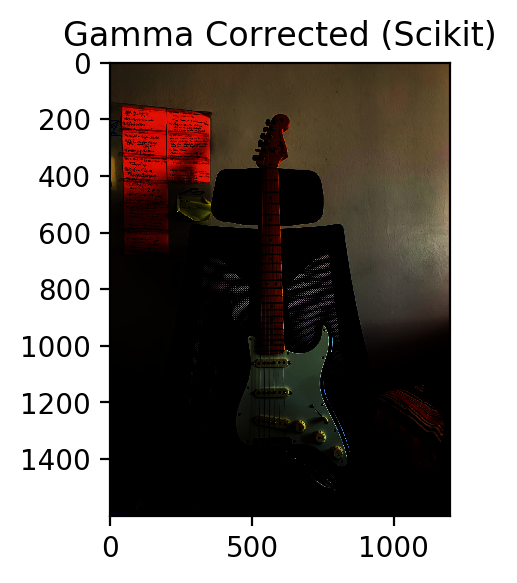

Error = 0


In [5]:
from skimage.exposure import adjust_gamma

average_gamma_corrected2 = adjust_gamma(average,9,0.9)

plt.imshow(average_gamma_corrected2)
plt.title("Gamma Corrected (Scikit)")
plt.show()

# Calculating Error of two image
err = average_gamma_corrected2-average_gamma_corrected
print("Error = {}".format(np.sum(err)))


Overflow shows itself here again. I fixed it by converting image to the float 64-bit data type (scaling between 0-1), then applied gamma correction. After done with the calculation, I multiplied the result with 255.

As a result of these processes, I get the same result with scikit-image library.

I calculated pixel by pixel error by substraction. Then I calculated total error by sum all the pixel error. As it can be seen total error is 0 (zero).

___

### Q6)

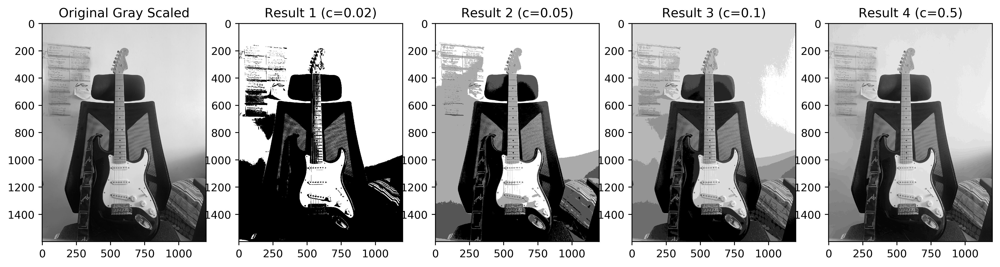

In [13]:
def log_transform(image,c=1):
    return (c*np.log10(1+image/255)*255).astype(np.uint8)

# Converting to Gray Scale
average_grayscale = cv2.cvtColor(average, cv2.COLOR_BGR2GRAY) 

# Try different parameters
parameters = [0.02, 0.05, 0.1, 0.5]
average_log_images = [log_transform(average_grayscale,c) for c in parameters]

# Plotting Images
num_rows = 1
num_columns = 5

f, ax_arr = plt.subplots(num_rows, num_columns, figsize=(16,8))
ax_arr[0].imshow(average_grayscale, cmap='gray')
ax_arr[0].set_title('Original Gray Scaled')

for i in range(num_columns-1):
    ax_arr[i+1].imshow(average_log_images[i], cmap='gray')
    ax_arr[i+1].set_title(f'Result {i+1} (c={parameters[i]})')

plt.show()

In my research, I found c is used for adjusting maximum pixel value to 255 for all images. So it is used as an adaptive parameter but I followed the lecture slides and implemented the formula that is used in the lecture. 

As it can be seen in the results, smaller c gives us the smaller range for low intensity colors.

___

### Q7)

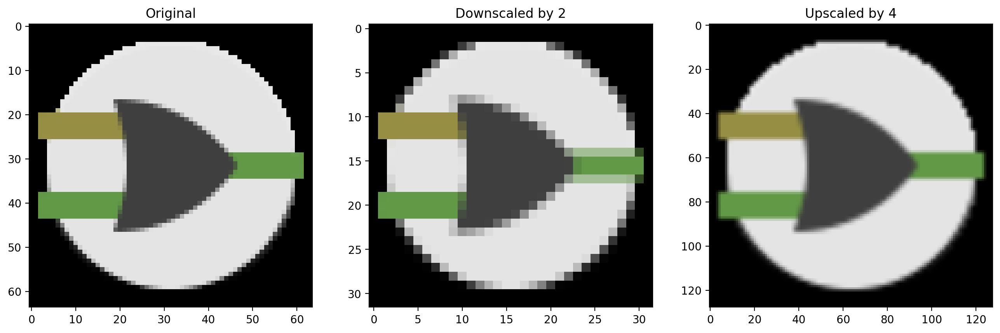

In [7]:
image = cv2.imread("assets/hw1/icon.png")

height, width, dimension = image.shape

upscaled_shape   = int(width*2),int(height*2)
downscaled_shape = int(width/2), int(height/2)

downscaled = cv2.resize(image,downscaled_shape)

upscaled = cv2.resize(image,upscaled_shape)

# Plotting Images
num_rows = 1
num_columns = 3

f, ax_arr = plt.subplots(num_rows, num_columns, figsize=(16,8))
ax_arr[0].imshow(image)
ax_arr[0].set_title('Original')

ax_arr[1].imshow(downscaled)
ax_arr[1].set_title('Downscaled by 2')

ax_arr[2].imshow(upscaled)
ax_arr[2].set_title('Upscaled by 4')

plt.rcParams['figure.dpi'] = 200 
plt.show()

As we scale down the image, we can see the resolution is decreased by the same ratio. Also when we interpolate that image by 4, we can not achieve same resolution at all. Furthermore, we can see blurry image at the end. That is an effect of interpolation because it behaves like an LPF (Low Pass Filter, averaging with respect to the its neighbour) basically.

___